# Object Detection

In this notebook, we will go through basics of Object Detection and use the API provided by Tensorflow Team.

Here we will use [Tensorflow](https://www.tensorflow.org/  "Tensorflow Homepage").


Everything is explained in-detail in [blog post](https://dudeperf3ct.github.io/object/detection/2019/01/07/Mystery-of-Object-Detection/). This is notebook which replicates the result of blog and runs in colab. Enjoy!


#### Run in Colab

You can run this notebook in google colab.

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/dudeperf3ct/DL_notebooks/blob/master/Object%20Detection/Tensorflow/object_detection_tensorflow.ipynb)

In [0]:
!git clone https://github.com/tensorflow/models.git
!apt-get -qq install libprotobuf-java protobuf-compiler
!protoc ./models/research/object_detection/protos/string_int_label_map.proto --python_out=.
!cp -R models/research/object_detection/ object_detection/
!rm -rf models
!pip install --upgrade youtube-dl

In [0]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [0]:
import os
os.mkdir('images')

!cp "/content/drive/My Drive/Colab Notebooks/dog.jpg" "images/dog.jpg"
!cp "/content/drive/My Drive/Colab Notebooks/horses.jpg" "images/horses.jpg"
!cp "/content/drive/My Drive/Colab Notebooks/person.jpg" "images/person.jpg"
!cp "/content/drive/My Drive/Colab Notebooks/beach.jpg" "images/beach.jpg"
!cp "/content/drive/My Drive/Colab Notebooks/two_dogs.jpg" "images/two_dogs.jpg"
!cp "/content/drive/My Drive/Colab Notebooks/ellen.jpg" "images/ellen.jpg"
!cp "/content/drive/My Drive/Colab Notebooks/selfie.jpg" "images/selfie.jpg"

## Object Detection using pretrained models and Object Detection API

In this tutorial we will use different pre-trained models to detect objects with help of Object Detection API provided by Google Tensorflow

In [0]:
import numpy as np
import os
from moviepy.editor import VideoFileClip
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile
import time
import youtube_dl
from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from object_detection.utils import ops as utils_ops

from PIL import Image

from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

%matplotlib inline

## Inference

Code Adapted: [Link](https://github.com/tensorflow/models/blob/master/research/object_detection/object_detection_tutorial.ipynb)

In [0]:
SSD_MOBILENET_MODEL_NAME = 'ssd_mobilenet_v2_coco_2018_03_29'

SSD_INCEPTION_MODEL_NAME = 'ssd_inception_v2_coco_2018_01_28'

FASTER_RCNN_INCEPTION_MODEL_NAME = 'faster_rcnn_inception_v2_coco_2018_01_28'

FASTER_RCNN_RESNET_AND_INCEPTION_MODEL_NAME = 'faster_rcnn_inception_resnet_v2_atrous_coco_2018_01_28'

FASTER_RCNN_RESNET101_MODEL_NAME = 'faster_rcnn_resnet101_kitti_2018_01_28'

FASTER_RCNN_NAS_MODEL_NAME = 'faster_rcnn_nas_coco_2018_01_28'

MASK_RCNN_RESNET101_MODEL_NAME = 'mask_rcnn_resnet101_atrous_coco_2018_01_28'

In [0]:
PATH_TO_TEST_IMAGES_DIR = 'images/'
TEST_IMAGES = os.listdir(PATH_TO_TEST_IMAGES_DIR)
TEST_IMAGE_PATHS = [PATH_TO_TEST_IMAGES_DIR + x  for x in TEST_IMAGES]
print (TEST_IMAGE_PATHS)

# Size, in inches, of the output images.
IMAGE_SIZE = (8, 8)

['images/beach.jpg', 'images/two_dogs.jpg', 'images/person.jpg', 'images/selfie.jpg', 'images/ellen.jpg', 'images/dog.jpg', 'images/horses.jpg']


In [0]:
# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = os.path.join('object_detection/data', 'mscoco_label_map.pbtxt')
NUM_CLASSES = 90

label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

def prepare_model(MODEL_NAME):
    MODEL_FILE = MODEL_NAME + '.tar.gz'
    DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/'

    # Path to frozen detection graph. This is the actual model that is used for the object detection.
    PATH_TO_CKPT = MODEL_NAME + '/frozen_inference_graph.pb'

    opener = urllib.request.URLopener()
    opener.retrieve(DOWNLOAD_BASE + MODEL_FILE, MODEL_FILE)
    tar_file = tarfile.open(MODEL_FILE)
    for file in tar_file.getmembers():
      file_name = os.path.basename(file.name)
      if 'frozen_inference_graph.pb' in file_name:
        tar_file.extract(file, os.getcwd())

    detection_graph = tf.Graph()
    with detection_graph.as_default():
      od_graph_def = tf.GraphDef()
      with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')

    return detection_graph


def load_image_into_numpy_array(image):
    (im_width, im_height) = image.size
    return np.array(image.getdata()).reshape(
        (im_height, im_width, 3)).astype(np.uint8)

In [0]:
def inference_and_plot(detection_graph):
    with detection_graph.as_default():
      with tf.Session(graph=detection_graph) as sess:
        
        # Definite input and output Tensors for detection_graph
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        # Each box represents a part of the image where a particular object was detected.
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        # Each score represent how level of confidence for each of the objects.
        # Score is shown on the result image, together with the class label.
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        
        for image_path in TEST_IMAGE_PATHS:
            
            start_time = time.time()
            image = Image.open(image_path)
            # the array based representation of the image will be used later in order to prepare the
            # result image with boxes and labels on it.
            image_np = load_image_into_numpy_array(image)
            # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
            image_np_expanded = np.expand_dims(image_np, axis=0)
            
            # Actual detection.
            (boxes, scores, classes, num) = sess.run(
                [detection_boxes, detection_scores, detection_classes, num_detections],
                feed_dict={image_tensor: image_np_expanded})
            end_time = time.time()
            
            # Visualization of the results of a detection.
            vis_util.visualize_boxes_and_labels_on_image_array(
                image_np,
                np.squeeze(boxes),
                np.squeeze(classes).astype(np.int32),
                np.squeeze(scores),
                category_index,
                use_normalized_coordinates=True,
                line_thickness=3)
            
            plt.figure(figsize=IMAGE_SIZE)
            plt.grid(visible=False)
            plt.xticks([])
            plt.yticks([])
            plt.imshow(image_np)
            plt.show()
            
            print ('Time taken: ', (end_time-start_time))

# Object Detection on Images

## SSD MobileNet Model

Model name: ssd_mobilenet_v2_coco_2018_03_29


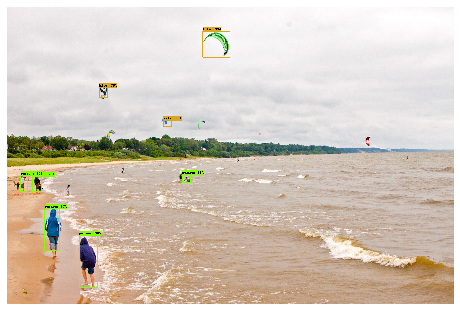

Time taken:  6.107773065567017


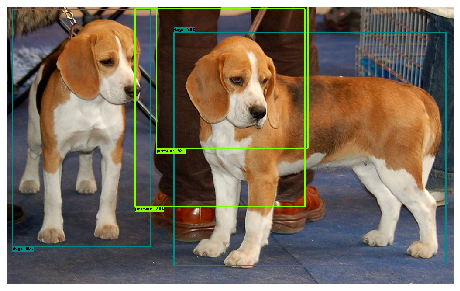

Time taken:  0.7237348556518555


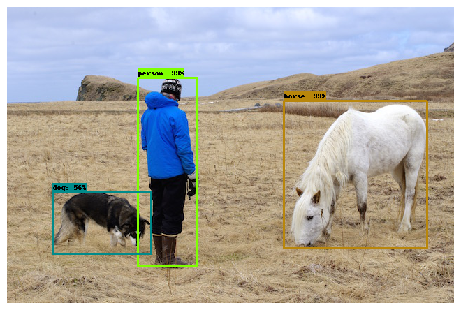

Time taken:  0.3573026657104492


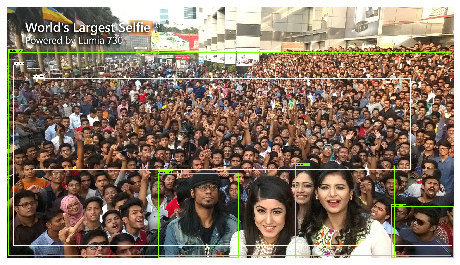

Time taken:  2.460151433944702


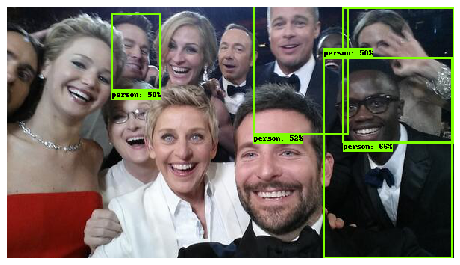

Time taken:  0.3042318820953369


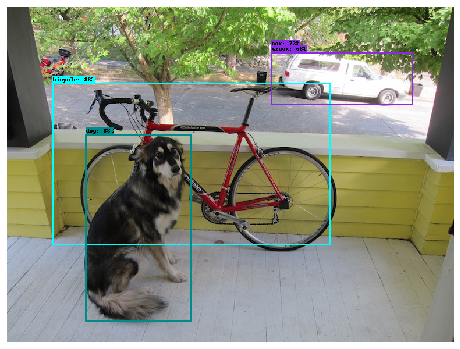

Time taken:  2.017934799194336


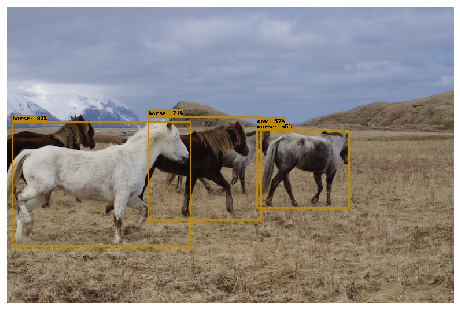

Time taken:  0.47826170921325684


In [0]:
print ('Model name:', SSD_MOBILENET_MODEL_NAME)
detection_graph = prepare_model(SSD_MOBILENET_MODEL_NAME)
inference_and_plot(detection_graph)

## SSD Inception Model

Model name: ssd_inception_v2_coco_2018_01_28


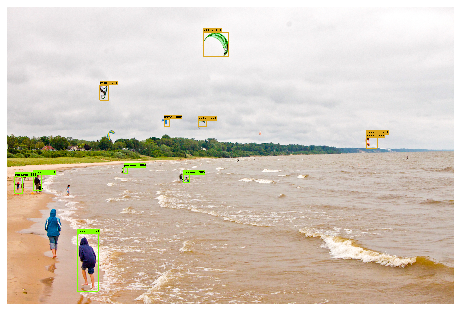

Time taken:  5.8093414306640625


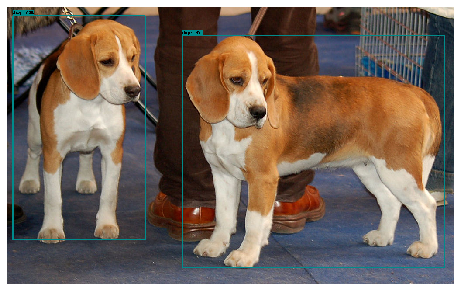

Time taken:  0.7340490818023682


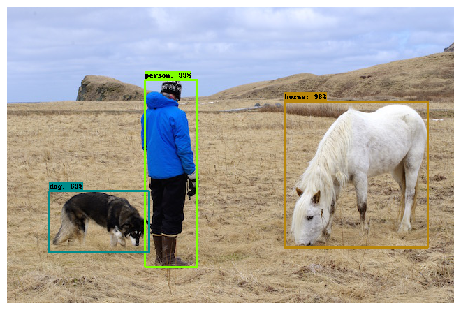

Time taken:  0.3741283416748047


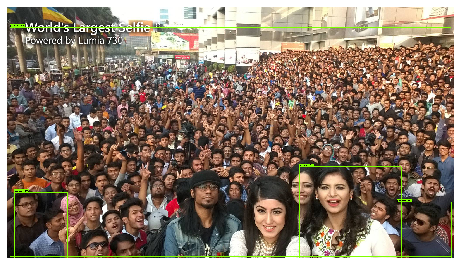

Time taken:  2.3109381198883057


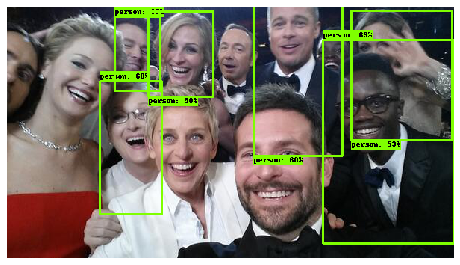

Time taken:  0.3297579288482666


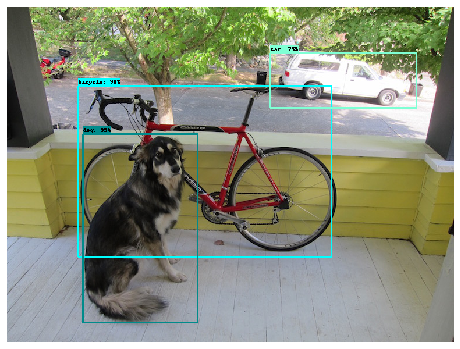

Time taken:  0.5310158729553223


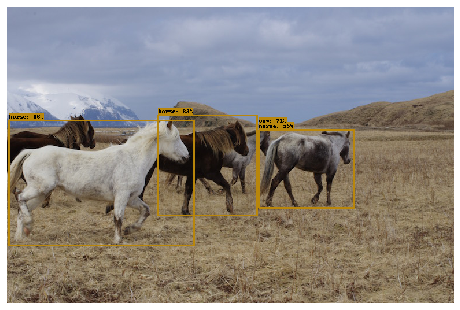

Time taken:  0.47640371322631836


In [0]:
print ('Model name:', SSD_INCEPTION_MODEL_NAME)
detection_graph = prepare_model(SSD_INCEPTION_MODEL_NAME)
inference_and_plot(detection_graph)

## Faster RCNN Inception Model

Model name: faster_rcnn_inception_v2_coco_2018_01_28


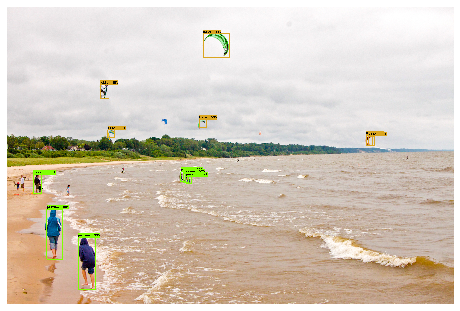

Time taken:  7.875209331512451


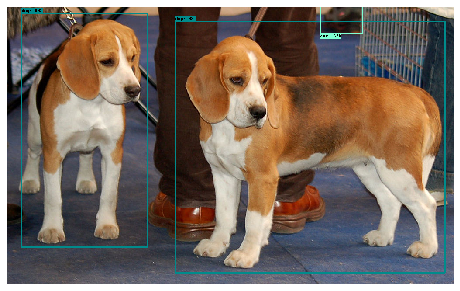

Time taken:  2.2720706462860107


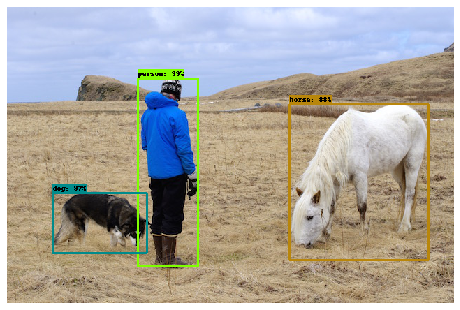

Time taken:  1.081212043762207


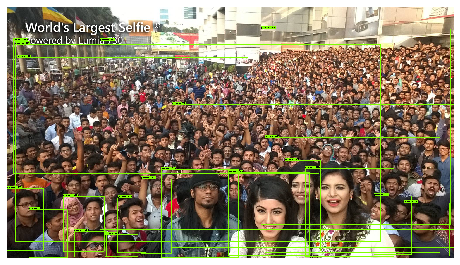

Time taken:  4.315333843231201


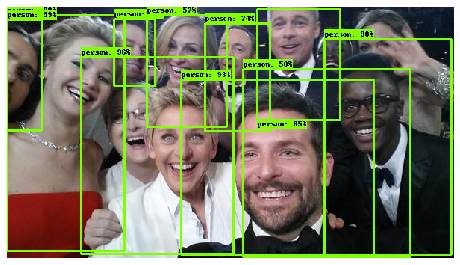

Time taken:  0.42949652671813965


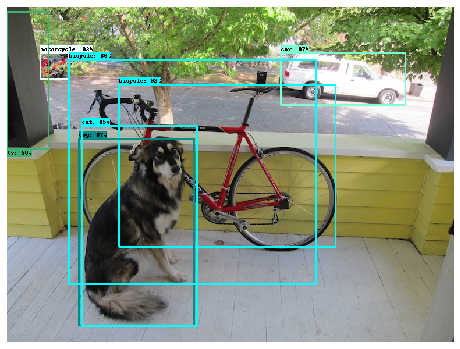

Time taken:  1.8879871368408203


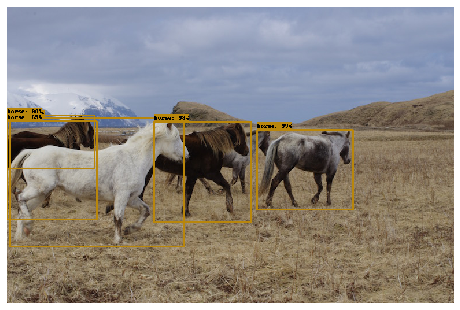

Time taken:  0.5837259292602539


In [0]:
print ('Model name:', FASTER_RCNN_INCEPTION_MODEL_NAME)
detection_graph = prepare_model(FASTER_RCNN_INCEPTION_MODEL_NAME)
inference_and_plot(detection_graph)

## Faster RCNN Resnet Inception Model 

Model name: faster_rcnn_inception_resnet_v2_atrous_coco_2018_01_28


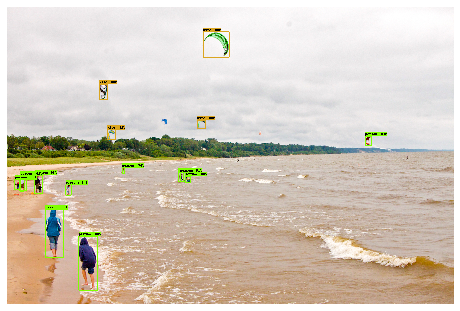

Time taken:  21.89930009841919


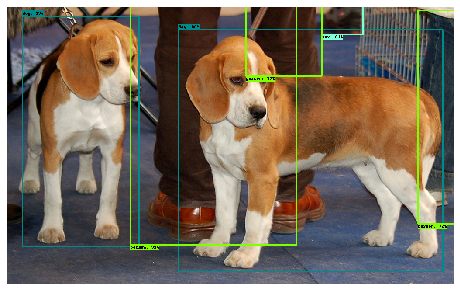

Time taken:  5.043653249740601


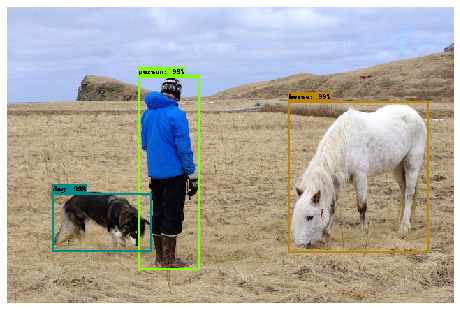

Time taken:  3.557638645172119


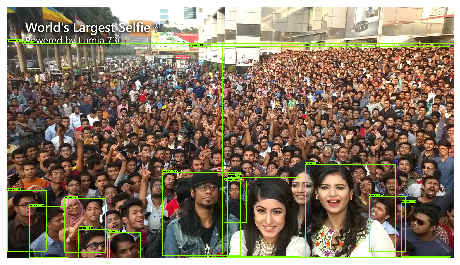

Time taken:  6.799132585525513


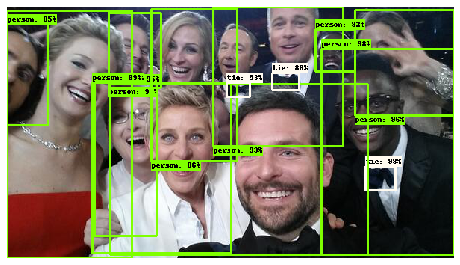

Time taken:  2.1520986557006836


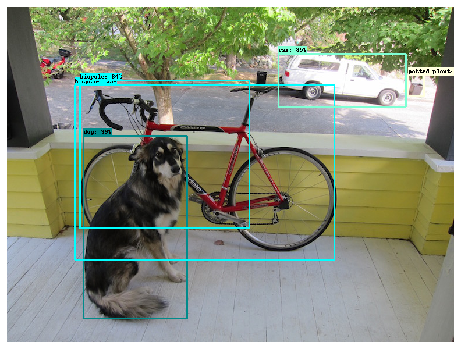

Time taken:  4.190009593963623


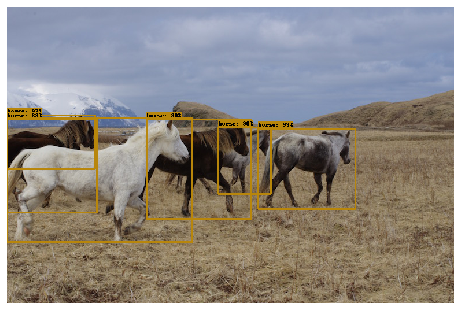

Time taken:  2.171036958694458


In [0]:
print ('Model name:', FASTER_RCNN_RESNET_AND_INCEPTION_MODEL_NAME)
detection_graph = prepare_model(FASTER_RCNN_RESNET_AND_INCEPTION_MODEL_NAME)
inference_and_plot(detection_graph)

## Faster RCNN Resnet101 Model

Model name: faster_rcnn_resnet101_kitti_2018_01_28


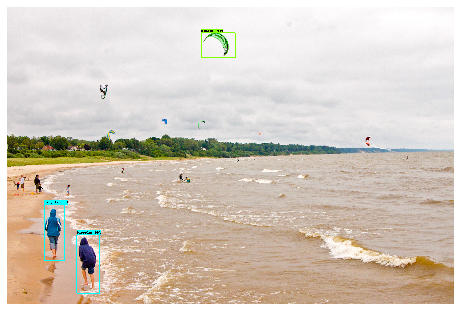

Time taken:  5.8119893074035645


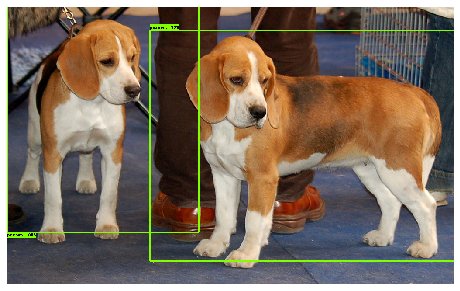

Time taken:  2.1829164028167725


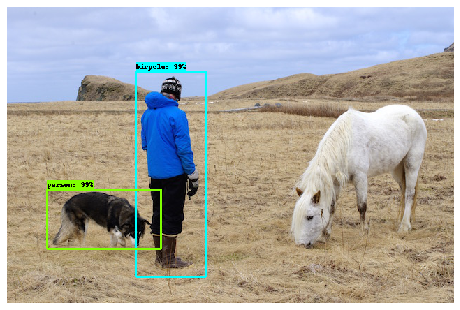

Time taken:  1.0862188339233398


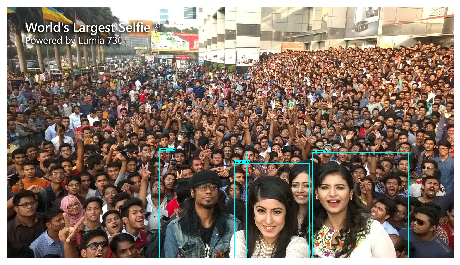

Time taken:  3.8531734943389893


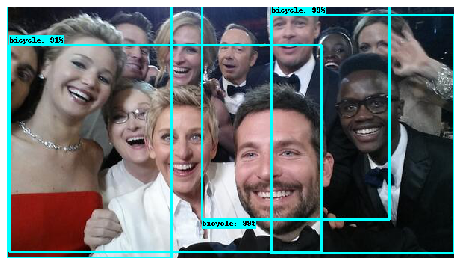

Time taken:  0.8149716854095459


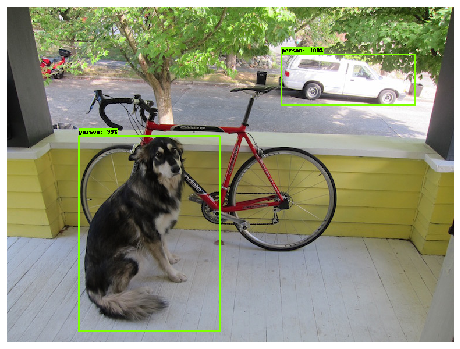

Time taken:  1.6464087963104248


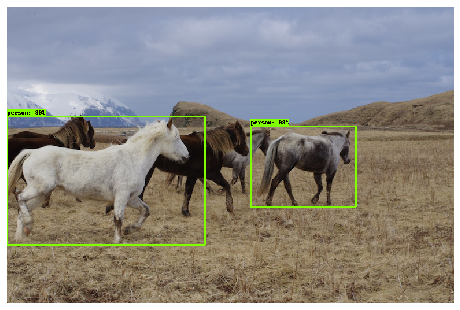

Time taken:  0.6658010482788086


In [0]:
print ('Model name:', FASTER_RCNN_RESNET101_MODEL_NAME)
detection_graph = prepare_model(FASTER_RCNN_RESNET101_MODEL_NAME)
inference_and_plot(detection_graph)

## Faster RCNN NAS Model

Model name: faster_rcnn_nas_coco_2018_01_28


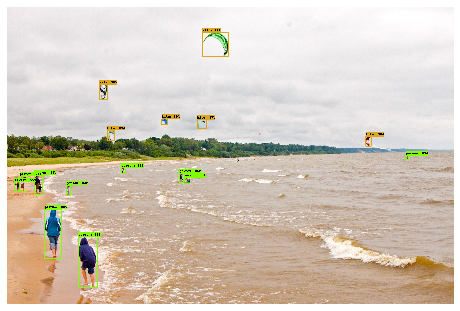

Time taken:  21.048731327056885


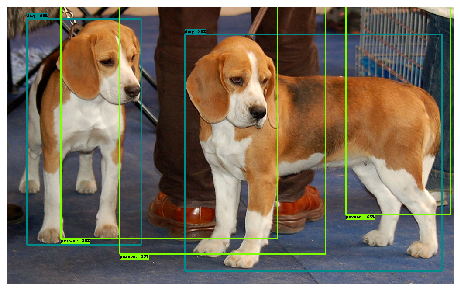

Time taken:  5.053203105926514


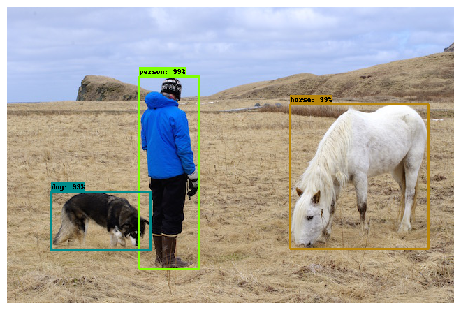

Time taken:  4.6736836433410645


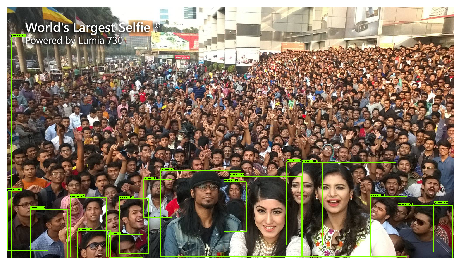

Time taken:  6.595485687255859


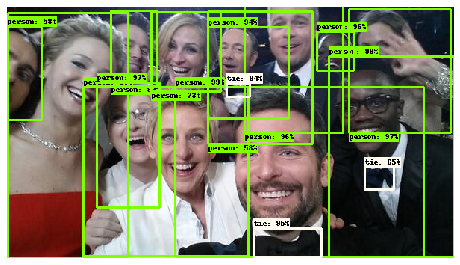

Time taken:  4.640063524246216


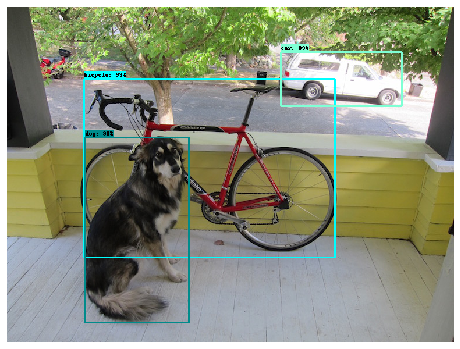

Time taken:  4.784106492996216


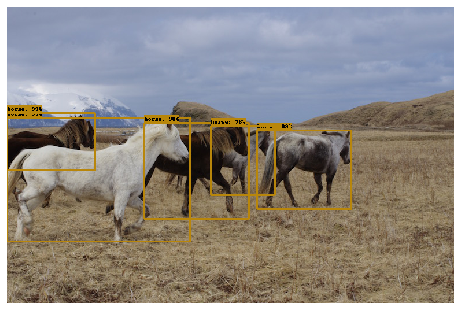

Time taken:  4.800266981124878


In [0]:
print ('Model name:', FASTER_RCNN_NAS_MODEL_NAME)
detection_graph = prepare_model(FASTER_RCNN_NAS_MODEL_NAME)
inference_and_plot(detection_graph)

## Mask RCNN  Resnet101 Model

Model name: mask_rcnn_resnet101_atrous_coco_2018_01_28


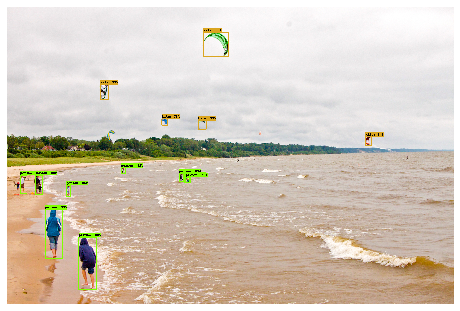

Time taken:  12.025237321853638


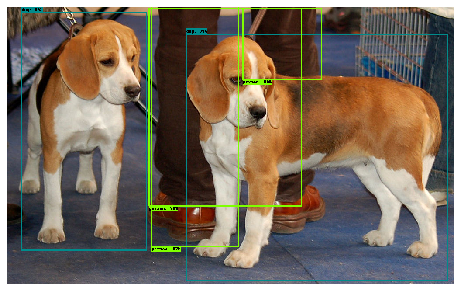

Time taken:  3.390413999557495


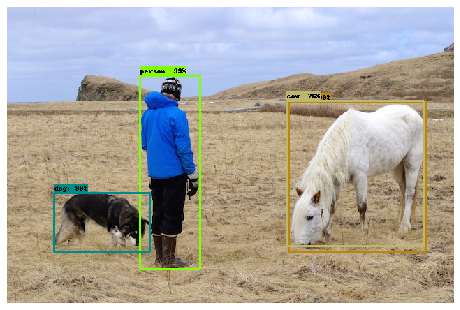

Time taken:  1.7376530170440674


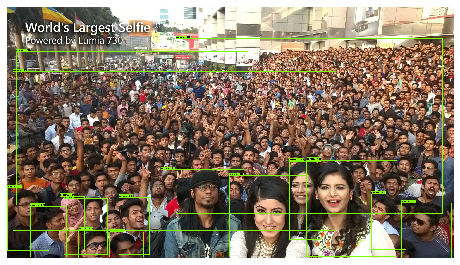

Time taken:  3.6867902278900146


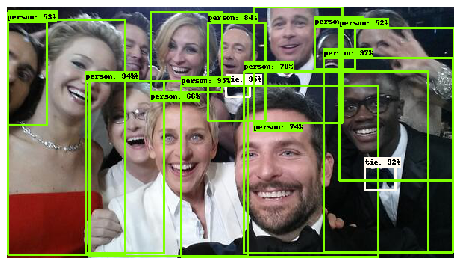

Time taken:  1.2572319507598877


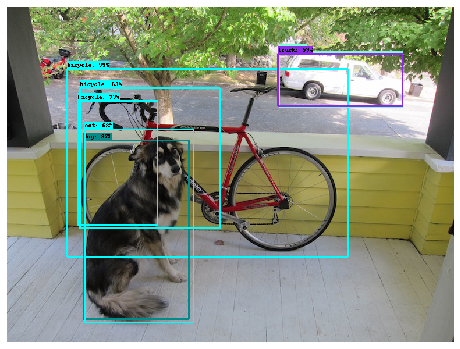

Time taken:  2.8289601802825928


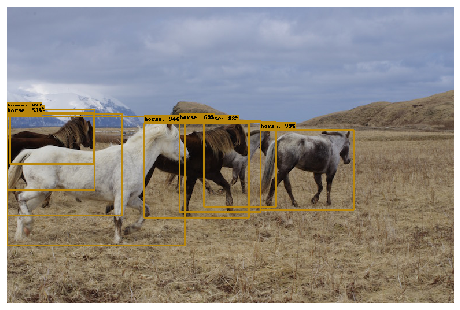

Time taken:  1.3886189460754395


In [0]:
print ('Model name:', MASK_RCNN_RESNET101_MODEL_NAME)
detection_graph = prepare_model(MASK_RCNN_RESNET101_MODEL_NAME)
inference_and_plot(detection_graph)

# Object Detection on Videos

## Mask R-CNN on video

In [0]:
def YouTube_download(url):
  ydl_opts = {
      'outtmpl': 'yt-video.%(ext)s'
  }
  with youtube_dl.YoutubeDL(ydl_opts) as ydl:
    ydl.download([url])

In [0]:
YouTube_download("https://www.youtube.com/watch?v=bAhprdemJKE")

In [0]:
def preprocess_image(image_np, sess, detection_graph):
  
    with detection_graph.as_default():
        
        ops = tf.get_default_graph().get_operations()
        all_tensor_names = {output.name for op in ops for output in op.outputs}
        tensor_dict = {}
        for key in [
              'num_detections', 'detection_boxes', 'detection_scores',
              'detection_classes', 'detection_masks'
          ]:
            tensor_name = key + ':0'
            if tensor_name in all_tensor_names:
                tensor_dict[key] = tf.get_default_graph().get_tensor_by_name(tensor_name)
                
        if 'detection_masks' in tensor_dict:
            # The following processing is only for single image
            detection_boxes = tf.squeeze(tensor_dict['detection_boxes'], [0])
            detection_masks = tf.squeeze(tensor_dict['detection_masks'], [0])
            # Reframe is required to translate mask from box coordinates to image coordinates and fit the image size.
            real_num_detection = tf.cast(tensor_dict['num_detections'][0], tf.int32)
            detection_boxes = tf.slice(detection_boxes, [0, 0], [real_num_detection, -1])
            detection_masks = tf.slice(detection_masks, [0, 0, 0], [real_num_detection, -1, -1])
            detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
                detection_masks, detection_boxes, image_np.shape[0], image_np.shape[1])
            detection_masks_reframed = tf.cast(
                tf.greater(detection_masks_reframed, 0.5), tf.uint8)
            # Follow the convention by adding back the batch dimension
            tensor_dict['detection_masks'] = tf.expand_dims(
                detection_masks_reframed, 0)
        image_tensor = tf.get_default_graph().get_tensor_by_name('image_tensor:0')

      # Run inference
        output_dict = sess.run(tensor_dict,
                             feed_dict={image_tensor: np.expand_dims(image_np, 0)})

      # all outputs are float32 numpy arrays, so convert types as appropriate
        output_dict['num_detections'] = int(output_dict['num_detections'][0])
        output_dict['detection_classes'] = output_dict['detection_classes'][0].astype(np.uint8)
        output_dict['detection_boxes'] = output_dict['detection_boxes'][0]
        output_dict['detection_scores'] = output_dict['detection_scores'][0]
        if 'detection_masks' in output_dict:
            output_dict['detection_masks'] = output_dict['detection_masks'][0]
            
        vis_util.visualize_boxes_and_labels_on_image_array(
          image_np,
          output_dict['detection_boxes'],
          output_dict['detection_classes'],
          output_dict['detection_scores'],
          category_index,
          instance_masks=output_dict.get('detection_masks'),
          use_normalized_coordinates=True,
          line_thickness=1)
        
        return image_np

In [0]:
def process_image(image): 
  
    global counter  
    if counter%1 ==0:
   
        with detection_graph.as_default():
            with tf.Session(graph=detection_graph) as sess:
                image_np = preprocess_image(image, sess, detection_graph) 

    counter +=1    
    return image

In [0]:
filename = 'yt-video.mp4'
new_loc = 'output_video.mp4'

counter = 0

detection_graph = prepare_model(MASK_RCNN_RESNET101_MODEL_NAME)
clip1 = VideoFileClip(filename).subclip(60, 68)
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!s
%time white_clip.write_videofile(new_loc, audio=False)

[MoviePy] >>>> Building video output_video.mp4
[MoviePy] Writing video output_video.mp4


100%|██████████| 240/240 [19:02<00:00,  4.67s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_video.mp4 

CPU times: user 18min 48s, sys: 17.6 s, total: 19min 5s
Wall time: 19min 9s


In [0]:
def YouTube_download(url):
  ydl_opts = {
      'outtmpl': 'video.%(ext)s'
  }
  with youtube_dl.YoutubeDL(ydl_opts) as ydl:
    ydl.download([url])

YouTube_download('https://www.youtube.com/watch?v=oGDHL1coPrw')

[youtube] oGDHL1coPrw: Downloading webpage
[youtube] oGDHL1coPrw: Downloading video info webpage
[download] Destination: video.f137.mp4
[download] 100% of 86.29MiB in 00:02
[download] Destination: video.f140.m4a
[download] 100% of 3.40MiB in 00:00
[ffmpeg] Merging formats into "video.mp4"
Deleting original file video.f137.mp4 (pass -k to keep)
Deleting original file video.f140.m4a (pass -k to keep)


In [0]:
filename = 'video.mp4'
new_loc = 'man_utd_video.mp4'

counter = 0

detection_graph = prepare_model(MASK_RCNN_RESNET101_MODEL_NAME)
clip1 = VideoFileClip(filename).subclip(49, 58)
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!s
%time white_clip.write_videofile(new_loc, audio=False)

[MoviePy] >>>> Building video man_utd_video.mp4
[MoviePy] Writing video man_utd_video.mp4


100%|█████████▉| 225/226 [17:05<00:04,  4.59s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: man_utd_video.mp4 

CPU times: user 16min 51s, sys: 16.4 s, total: 17min 8s
Wall time: 17min 10s


In [0]:
!cp "man_utd_video.mp4" "/content/drive/My Drive/Colab Notebooks/man_utd_video.mp4"
!cp "output_video.mp4" "/content/drive/My Drive/Colab Notebooks/output_video.mp4" 